In [1]:
pip install bertopic[visualization] sentence-transformers umap-learn hdbscan tqdm


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import pandas as pd
import umap
import hdbscan
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [4]:
df = pd.read_csv(r"C:\Users\balaj\code_files\Documents\Brahmanda\context_aware_risk_methodology\event_causal_prediction_system\data\causal_gold_articles_full_llama3.2.csv")  # Load your data

In [6]:
df.columns

Index(['Doc_ID', 'Date', 'Headline', 'Content', 'gold_cause', 'gold_effect',
       'gold_cause_effect_summary', 'gold_general_summary',
       'gold_general_embedding', 'gold_relevance_score', 'causal_only',
       'assigned_topic', 'topic_similarity'],
      dtype='object')

In [5]:


docs = df["gold_general_summary"].fillna("No summary").tolist()

# Topic prototypes
topic_prototypes = {
    "Safe-Haven Demand": "Gold demand rises due to geopolitical tensions and war uncertainty",
    "Inflation Hedge": "Gold surges as inflation rises and central banks cut interest rates",
    "Central Bank Buying": "Central banks increase gold reserves amid de-dollarization efforts",
    "ETF & Retail Sentiment": "Retail investors shift into gold ETFs during market turbulence",
    "Trade War Tariffs": "Gold gains as Trump announces new tariffs and trade war escalates",
    "Volatility Hedging": "Gold options and VIX surge due to market fear and instability",
    "Asset Rotation": "Investors rotate from equities to gold in risk-off macro environment"
}

# Embedding
model = SentenceTransformer("all-MiniLM-L6-v2")
article_embeddings = model.encode(docs, show_progress_bar=True)
prototype_embeddings = model.encode(list(topic_prototypes.values()))

# Assign topic
sims = cosine_similarity(article_embeddings, prototype_embeddings)
best_idx = sims.argmax(axis=1)
best_scores = sims.max(axis=1)
topic_names = list(topic_prototypes.keys())
df["assigned_topic"] = [topic_names[i] for i in best_idx]
df["topic_similarity"] = best_scores

# Save output
df.to_csv("causal_gold_articles_with_topics.csv", index=False)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [7]:
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Load data

docs = df["gold_general_summary"].fillna("No summary").tolist()

# Topic prototypes
topic_prototypes = {
    "Safe-Haven Demand": "Gold demand rises due to geopolitical tensions and war uncertainty",
    "Inflation Hedge": "Gold surges as inflation rises and central banks cut interest rates",
    "Central Bank Buying": "Central banks increase gold reserves amid de-dollarization efforts",
    "ETF & Retail Sentiment": "Retail investors shift into gold ETFs during market turbulence",
    "Trade War Tariffs": "Gold gains as Trump announces new tariffs and trade war escalates",
    "Volatility Hedging": "Gold options and VIX surge due to market fear and instability",
    "Asset Rotation": "Investors rotate from equities to gold in risk-off macro environment"
}

# Use a stronger BERT model
model = SentenceTransformer("bert-base-nli-mean-tokens")  # You can replace with another

# Generate embeddings
article_embeddings = model.encode(docs, show_progress_bar=True, convert_to_numpy=True)
prototype_embeddings = model.encode(list(topic_prototypes.values()), convert_to_numpy=True)

# Compute similarities
sims = cosine_similarity(article_embeddings, prototype_embeddings)
best_idx = sims.argmax(axis=1)
best_scores = sims.max(axis=1)
topic_names = list(topic_prototypes.keys())

# Assign topics
df["assigned_topic_bert"] = [topic_names[i] for i in best_idx]
df["topic_similarity"] = best_scores

# Save
df.to_csv("causal_gold_articles_with_topics_bert.csv", index=False)


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.77k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/399 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/219 [00:00<?, ?it/s]

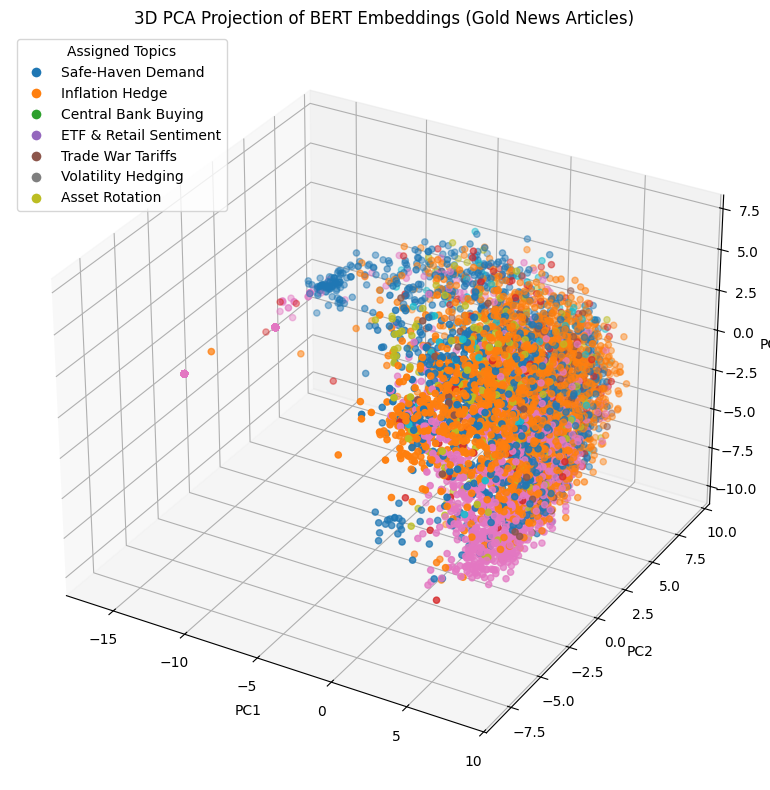

In [8]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
pca = PCA(n_components=3)
reduced_embeddings = pca.fit_transform(article_embeddings)
df["x"], df["y"], df["z"] = reduced_embeddings[:, 0], reduced_embeddings[:, 1], reduced_embeddings[:, 2]

# Step 7: Visualize in 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Map topics to integers for color encoding
topic_to_index = {topic: i for i, topic in enumerate(topic_names)}
colors = df["assigned_topic"].map(topic_to_index)

# 3D scatter plot
scatter = ax.scatter(df["x"], df["y"], df["z"], c=colors, cmap="tab10", s=20)

# Custom legend
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=topic,
               markerfacecolor=plt.cm.tab10(i / len(topic_names)), markersize=8)
    for i, topic in enumerate(topic_names)
]
ax.legend(handles=legend_handles, title="Assigned Topics", loc='upper left')

# Labels and title
ax.set_title("3D PCA Projection of BERT Embeddings (Gold News Articles)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

plt.tight_layout()
plt.show()

In [9]:
df_with_embeddings = pd.read_csv(r"C:\Users\balaj\code_files\Documents\Brahmanda\context_aware_risk_methodology\event_causal_prediction_system\scripts\causal_gold_articles_with_topics_bert.csv")

In [10]:
df_with_embeddings.head()
df_with_embeddings.columns

Index(['Doc_ID', 'Date', 'Headline', 'Content', 'gold_cause', 'gold_effect',
       'gold_cause_effect_summary', 'gold_general_summary',
       'gold_general_embedding', 'gold_relevance_score', 'causal_only',
       'assigned_topic', 'topic_similarity', 'assigned_topic_bert'],
      dtype='object')

In [13]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.decomposition import PCA
import ast

# Load the dataset
df= df_with_embeddings.copy()

# Ensure 'gold_general_embedding' is converted from string to list of floats
df["embedding"] = df["gold_general_embedding"].apply(lambda x: np.array(ast.literal_eval(x)))

# Stack into 2D matrix
embeddings = np.vstack(df["embedding"].values)

# Reduce to 3D using PCA
pca = PCA(n_components=3)
reduced = pca.fit_transform(embeddings)
df["x"], df["y"], df["z"] = reduced[:, 0], reduced[:, 1], reduced[:, 2]

# Convert date column to datetime format
df["Date"] = pd.to_datetime(df["Date"], errors='coerce')

# Drop rows with invalid dates (optional but recommended for animation)
df = df.dropna(subset=["Date"])
# Interactive 3D scatter plot with timeline (date slider)
fig = px.scatter_3d(
    df,
    x="x",
    y="y",
    z="z",
    color="assigned_topic_bert",
    animation_frame=df["Date"].dt.strftime('%Y-%m-%d'),
    hover_name="Headline",
    hover_data={
        "Doc_ID": True,
        "gold_relevance_score": True,
        "topic_similarity": True,
        "assigned_topic_bert": True,
        "Date": True,
        "x": False,
        "y": False,
        "z": False
    },
    title="3D Visualization of Gold News Articles Over Time (BERT Topic Assignments)"
)

fig.update_layout(
    scene=dict(
        xaxis_title="PCA 1",
        yaxis_title="PCA 2",
        zaxis_title="PCA 3"
    ),
    margin=dict(l=0, r=0, b=0, t=50)
)

fig.show()


In [ ]:
import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.decomposition import PCA
import ast

st.set_page_config(layout="wide")
st.title("🪙 3D Visualization of Gold News Articles Over Time")

# Load the CSV file
df = df_with_embeddings.copy()

# Convert 'gold_general_embedding' from string to list of floats
df["embedding"] = df["gold_general_embedding"].apply(lambda x: np.array(ast.literal_eval(x)))

# Stack embeddings into a 2D array
embeddings = np.vstack(df["embedding"].values)

# Reduce to 3D using PCA
pca = PCA(n_components=3)
reduced = pca.fit_transform(embeddings)
df["x"], df["y"], df["z"] = reduced[:, 0], reduced[:, 1], reduced[:, 2]

# Convert Date to datetime and drop malformed rows
df["Date"] = pd.to_datetime(df["Date"], errors='coerce')
df = df.dropna(subset=["Date"])

# Create date range slider using native Python datetime.date
min_date = df["Date"].min().date()
max_date = df["Date"].max().date()
date_range = st.slider(
    "Select Date Range:",
    min_value=min_date,
    max_value=max_date,
    value=(min_date, max_date),
    format="YYYY-MM-DD"
)

# Filter data based on date range
mask = (df["Date"].dt.date >= date_range[0]) & (df["Date"].dt.date <= date_range[1])
filtered_df = df[mask]

# 3D Scatter plot using Plotly
fig = px.scatter_3d(
    filtered_df,
    x="x",
    y="y",
    z="z",
    color="assigned_topic",
    hover_name="Headline",
    hover_data={
        "Doc_ID": True,
        "gold_relevance_score": True,
        "topic_similarity": True,
        "assigned_topic": True,
        "Date": True,
    },
    title=f"3D Projection of News Articles ({date_range[0]} to {date_range[1]})"
)

fig.update_layout(
    scene=dict(
        xaxis_title="PCA 1",
        yaxis_title="PCA 2",
        zaxis_title="PCA 3"
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

st.plotly_chart(fig, use_container_width=True)


2025-04-30 16:43:43.086 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:43.086 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:43.087 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:48.427 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:48.428 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:48.428 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:48.429 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:43:48.429 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bar

AttributeError: 'datetime.date' object has no attribute 'date'